<a href="https://colab.research.google.com/github/audreysiqiliu/Visual-Search-Patterns/blob/main/Ts_and_Ls_Test_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ts and Ls Test Data
Goals:
1. get estimate for time spent on the experiment
2. visualize search time and performance
3. test basic click analyses

In [ ]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import json
import os
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

from IPython.display import HTML
from google.colab import drive

Make dataframe from all .json files in the data directory.

In [ ]:
# Mount google drive
drive.mount('/content/drive')

# Load data files from directory
data_dir = '/content/drive/My Drive/MTurkify Ts & Ls/Analyses/Ts-and-Ls_v1_private_pilot_1' # requires shortcut to MTurkify Ts & Ls in My Drive
json_files = [f for f in os.listdir(data_dir) if f.endswith('.json')]

# List to hold data from all participants
all_data = []

# Iterate over each file in the directory
for filename in os.listdir(data_dir):
    if filename.endswith('.json'):
        with open(os.path.join(data_dir, filename), 'r') as f:
            data = json.load(f)

            # Extract experimentDuration and expTrialsDuration
            experiment_duration = data.get('experimentDuration', None)
            exp_trials_duration = data.get('expTrialsDuration', None)

            # Add these values to each trial's data
            for trial in data['trialDataLog']:
                trial['experimentDuration'] = experiment_duration
                trial['expTrialsDuration'] = exp_trials_duration
                trial['subjectId'] = data['subjectId']  # Also adding subjectId for reference
                all_data.append(trial)

# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(all_data)

# View dataframe
df.head()

Mounted at /content/drive


,logCounter,iBlock,iTrial,trialType,highSalienceDistractorCount,lowSalienceDistractorCount,totalSearchTime,timeoutReached,hitCount,faCount,missCount,allClicks,mouseTrajectory,experimentDuration,expTrialsDuration,subjectId
0,0,0,1,no_target,1,24,30000,True,0,0,0,[],[],NaN,NaN,413630
1,1,0,2,single_low,4,20,6614,False,0,1,1,"[{""x"":692,""y"":181.5,""correct"":false,""time"":640...","[{""x"":401,""y"":300.5,""time"":27,""speed"":0},{""x"":...",NaN,NaN,413630
2,2,6,10,no_target,2,23,19988,False,0,1,0,"[{""x"":354,""y"":253.5,""correct"":false,""time"":195...","[{""x"":416,""y"":298.5,""time"":12,""speed"":-0.04483...",NaN,NaN,413630
3,0,0,1,no_target,3,22,1505,False,0,1,0,"[{""x"":191,""y"":88,""correct"":false,""time"":1326,""...","[{""x"":400,""y"":302,""time"":143,""speed"":0},{""x"":4...",192287.0,NaN,406662
4,1,0,10,dual,2,21,821,False,0,1,2,"[{""x"":353,""y"":278,""correct"":false,""time"":665,""...","[{""x"":403,""y"":303,""time"":56,""speed"":-0.1781978...",192287.0,NaN,406662


Show the total number of participants and create filtered_df containing only participants with valid experiment durations (those who completed the whole experiment).

In [ ]:
# List of exceptions: subjectIds to exclude for unspecified reasons
exceptions = [172015]

# Filter out the exceptions
df = df[~df['subjectId'].isin(exceptions)]

# Total number of participants
total_participants = df['subjectId'].nunique()

# Number of participants with valid experimentDuration
df_filtered = df.dropna(subset=['experimentDuration', 'expTrialsDuration']).copy()
participants_with_valid_durations = df_filtered['subjectId'].nunique()

print(f"Total participants: {total_participants}")
print(f"Participants with valid experiment durations: {participants_with_valid_durations}")

Total participants: 10
Participants with valid experiment durations: 8


Calculate the time in minutes and seconds that each participant spent on instructions + practice and on the experiment trials.

In [ ]:
def convert_to_min_sec(time_in_minutes):
    minutes = int(time_in_minutes)
    seconds = int((time_in_minutes - minutes) * 60)
    return f"{minutes}m {seconds}s"

# Calculate the time spent on instructions and practice trials
df_filtered.loc[:, 'instruction_and_practice_duration'] = (df_filtered['experimentDuration'] - df_filtered['expTrialsDuration']) / 60000  # Convert to minutes

# Group by subjectId to get the unique duration for each participant
instruction_durations = df_filtered.groupby('subjectId')['instruction_and_practice_duration'].first()
exp_trials_durations = df_filtered.groupby('subjectId')['expTrialsDuration'].first() / 60000  # Convert to minutes

# Convert to minutes and seconds format
instruction_durations = instruction_durations.apply(convert_to_min_sec)
exp_trials_durations = exp_trials_durations.apply(convert_to_min_sec)

# Calculate mean times
mean_instruction_and_practice = df_filtered['instruction_and_practice_duration'].mean()
mean_exp_trials = (df_filtered['expTrialsDuration'] / 60000).mean()  # Convert to minutes

# Convert the means to minutes and seconds format
mean_instruction_and_practice_str = convert_to_min_sec(mean_instruction_and_practice)
mean_exp_trials_str = convert_to_min_sec(mean_exp_trials)

# Print the mean times
print(instruction_durations)
print(f"Mean time spent on instructions and practice trials: {mean_instruction_and_practice_str}")

print(exp_trials_durations)
print(f"Mean time spent on experiment trials: {mean_exp_trials_str}")

subjectId
205632    4m 23s
250345    4m 14s
359154    7m 46s
597963    6m 45s
621257    3m 13s
725248    7m 29s
862052    13m 3s
942896    6m 24s
Name: instruction_and_practice_duration, dtype: object
Mean time spent on instructions and practice trials: 6m 40s
subjectId
205632    14m 50s
250345    10m 51s
359154    15m 41s
597963    11m 32s
621257     9m 31s
725248     9m 56s
862052    11m 21s
942896    16m 20s
Name: expTrialsDuration, dtype: object
Mean time spent on experiment trials: 12m 30s


On average participants took **6 m 40 s** on instructions and 12 practice trials, and **12 m 30 s** on 60 experimental trials.

**Each experimental trial took 12.5 seconds on average.**

## Total Search Time Vis.

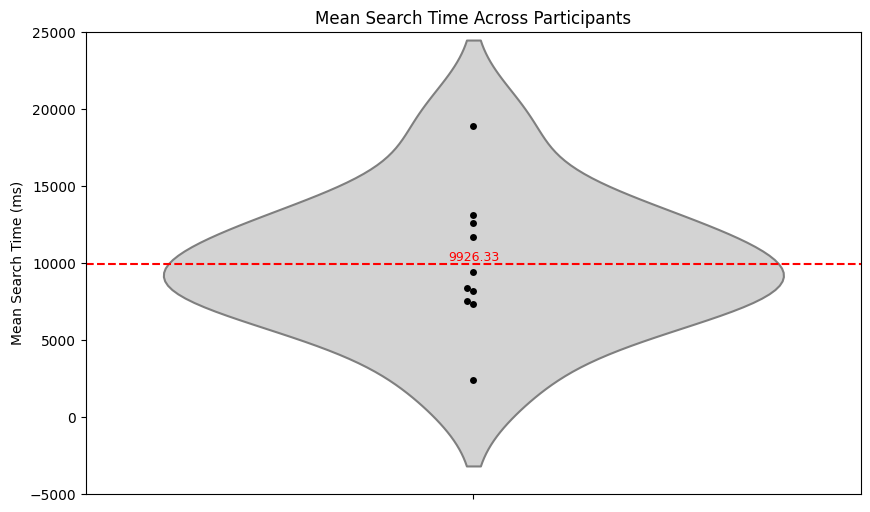

In [ ]:
# Calculate the mean search time for each participant
mean_search_times = df.groupby('subjectId')['totalSearchTime'].mean().reset_index()

# Calculate the overall mean search time across all participants
mean = mean_search_times['totalSearchTime'].mean()

# Violin plot combined with swarm plot
plt.figure(figsize=(10, 6))
sns.violinplot(y=mean_search_times['totalSearchTime'], inner=None, color='lightgray')
sns.swarmplot(y=mean_search_times['totalSearchTime'], color='black', size=5)
plt.ylim(-5000, 25000)  # Set these based on your data's range.
plt.axhline(mean, color='red', linestyle='--')  # Added a horizontal line for the mean
plt.text(0, mean, f"{mean:.2f}", ha='center', va='bottom', color='red', fontsize=9)  # Adjusted vertical alignment
plt.title('Mean Search Time Across Participants')
plt.ylabel('Mean Search Time (ms)')
plt.show()


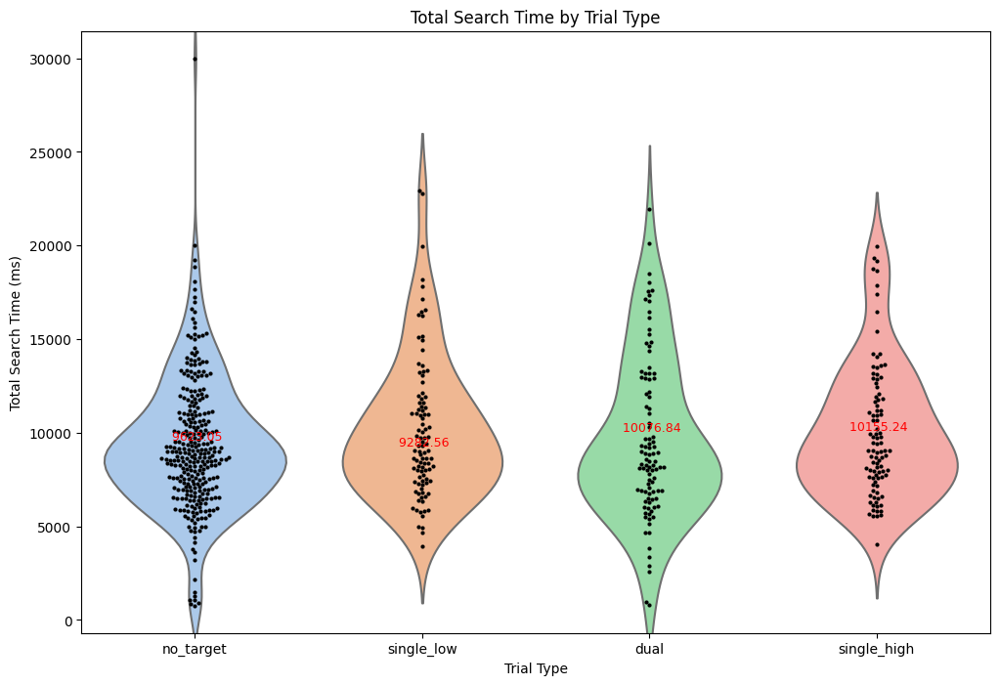

In [ ]:
# Violin plot combined with swarm plot for total search times split by trial type
# All trials across participants (unaveraged)

plt.figure(figsize=(12, 8))

# Create the violin and swarm plots
sns.violinplot(data=df, x='trialType', y='totalSearchTime', inner=None, palette='pastel')
sns.swarmplot(data=df, x='trialType', y='totalSearchTime', color='black', size=3)

# Calculate and annotate the mean for each trial type
means = df.groupby('trialType')['totalSearchTime'].mean()
for i, mean in enumerate(means):
    plt.text(i, mean, f" {mean:.2f}", ha='center', color='red', fontsize=9)

plt.title('Total Search Time by Trial Type')
plt.ylabel('Total Search Time (ms)')
plt.xlabel('Trial Type')
plt.show()


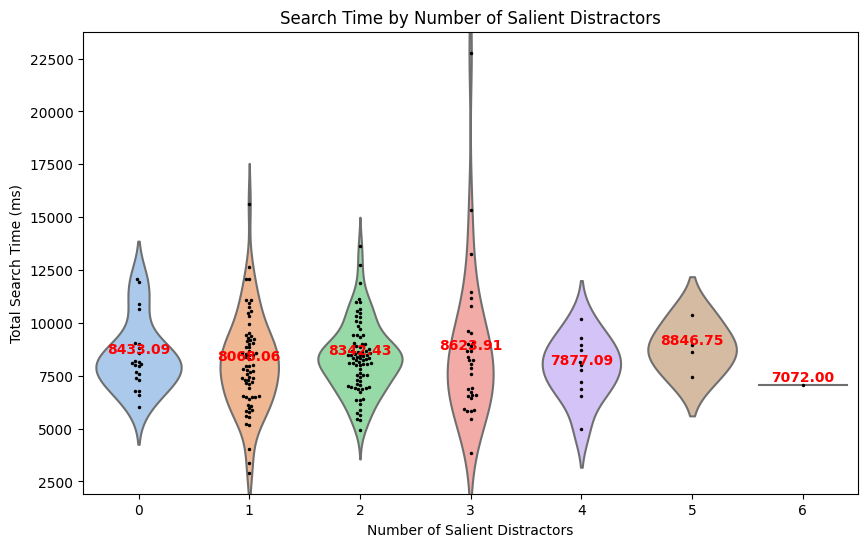

In [ ]:
# Create a violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(data=df_filtered, x='highSalienceDistractorCount', y='totalSearchTime', inner=None, palette='pastel', alpha=0.7)

# Add a swarmplot to show individual data points
sns.swarmplot(data=df_filtered, x='highSalienceDistractorCount', y='totalSearchTime', color='black', size=2.5)

# Calculate the mean for each salient distractor number and plot it
means = df_filtered.groupby('highSalienceDistractorCount')['totalSearchTime'].mean()
for i, mean in enumerate(means):
    plt.text(i, mean, f"{mean:.2f}", ha='center', va='bottom', color='red', weight='bold')

# Add titles and labels
plt.title('Search Time by Number of Salient Distractors')
plt.xlabel('Number of Salient Distractors')
plt.ylabel('Total Search Time (ms)')  # Assuming search time is in milliseconds
plt.show()

## Performance Metrics Vis: Hits, Misses, FAs

<ipython-input-11-8c73344fb2a2>:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_long, x='trialType', y='Count', hue='PerformanceMetric', alpha=0.5, ci=None, dodge=True)


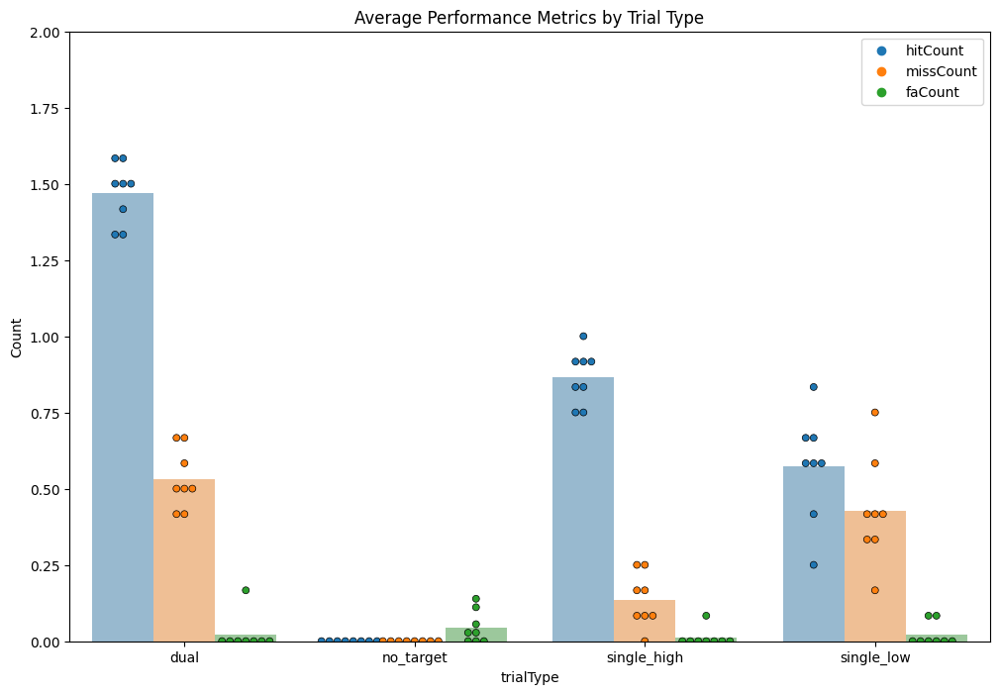

In [ ]:
# Compute the average for each participant for each trial type
participant_averages = df_filtered.groupby(['subjectId', 'trialType']).agg({
    'hitCount': 'mean',
    'missCount': 'mean',
    'faCount': 'mean'
}).reset_index()

# Melt the DataFrame for plotting
df_long = participant_averages.melt(id_vars=['subjectId', 'trialType'], value_vars=['hitCount', 'missCount', 'faCount'],
                                    var_name='PerformanceMetric', value_name='Count')

# Plot the general average
plt.figure(figsize=(12, 8))
plt.ylim(0, 2)  # Set these based on your data's range.

# Bar plot for general averages
sns.barplot(data=df_long, x='trialType', y='Count', hue='PerformanceMetric', alpha=0.5, ci=None, dodge=True)

# Overlay individual participant averages
sns.swarmplot(data=df_long, x='trialType', y='Count', hue='PerformanceMetric', dodge=True, marker='o', size=5, edgecolor='black', linewidth=0.5)

# Adjust legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[:3], labels[:3], loc='upper right')

plt.title('Average Performance Metrics by Trial Type')
plt.ylabel('Count')
plt.show()


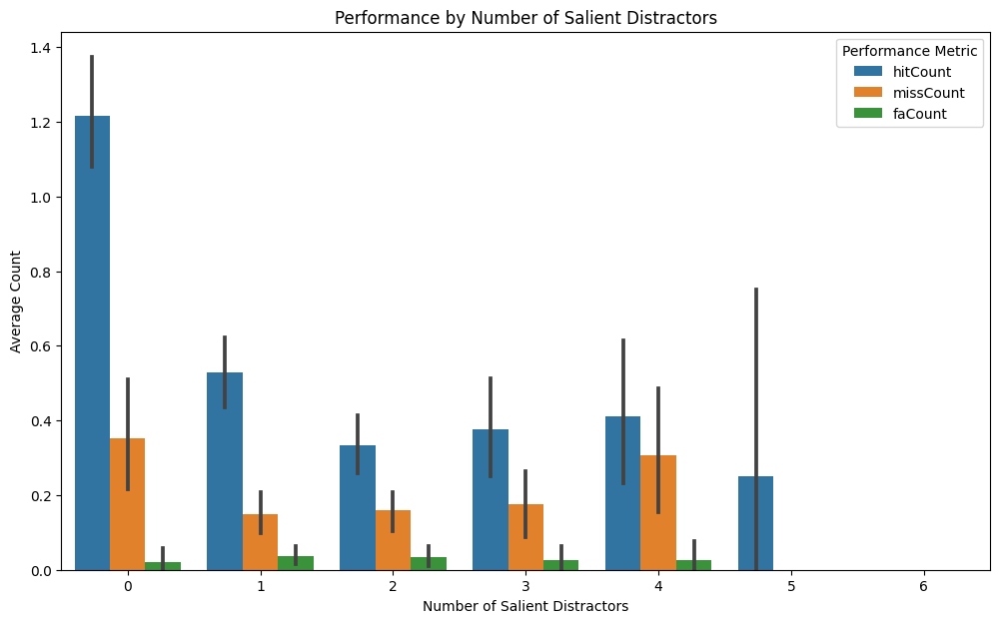

In [ ]:
# Reshape the dataframe to long format
df_long = df_filtered.melt(id_vars='highSalienceDistractorCount', value_vars=['hitCount', 'missCount', 'faCount'],
                           var_name='PerformanceMetric', value_name='Count')

plt.figure(figsize=(12, 7))
sns.barplot(data=df_long, x='highSalienceDistractorCount', y='Count', hue='PerformanceMetric')
plt.title('Performance by Number of Salient Distractors')
plt.xlabel('Number of Salient Distractors')
plt.ylabel('Average Count')
plt.legend(title='Performance Metric')
plt.show()

## Click Location Vis.

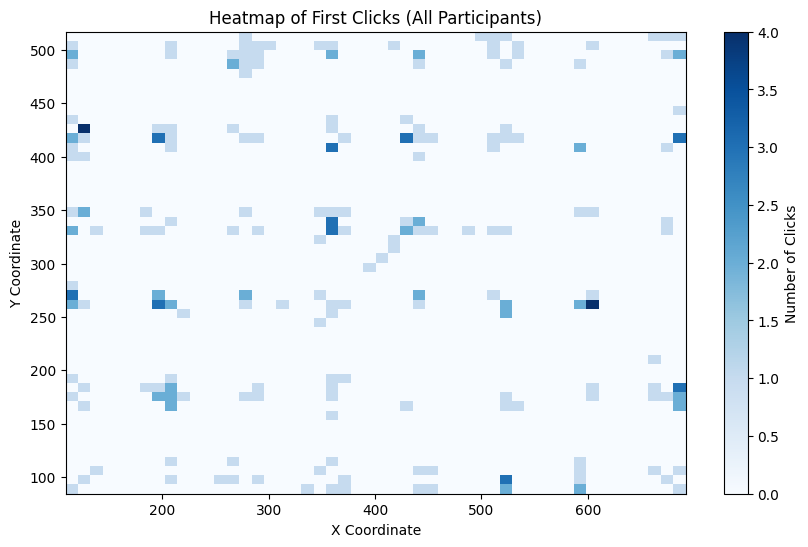

In [ ]:
# Function to safely evaluate the string
def safe_eval(s):
    if not s:
        return None
    s = s.replace('false', 'False').replace('true', 'True').replace('null', 'None')
    return eval(s)

# Assuming df['allClicks'] contains the click data and the first click is the first entry
# Extracting the x, y coordinates of the first click for each participant
df_filtered['first_click_x'] = df_filtered['allClicks'].apply(lambda x: safe_eval(x)[0]['x'] if safe_eval(x) else None)
df_filtered['first_click_y'] = df_filtered['allClicks'].apply(lambda x: safe_eval(x)[0]['y'] if safe_eval(x) else None)

# 1. Heatmap for All Participants Together
plt.figure(figsize=(10, 6))
plt.hist2d(df_filtered['first_click_x'].dropna(), df_filtered['first_click_y'].dropna(), bins=50, cmap='Blues')
plt.colorbar(label='Number of Clicks')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.title('Heatmap of First Clicks (All Participants)')
plt.show()

First clicks tend to be close to the center and the bottom left corner of the screen.

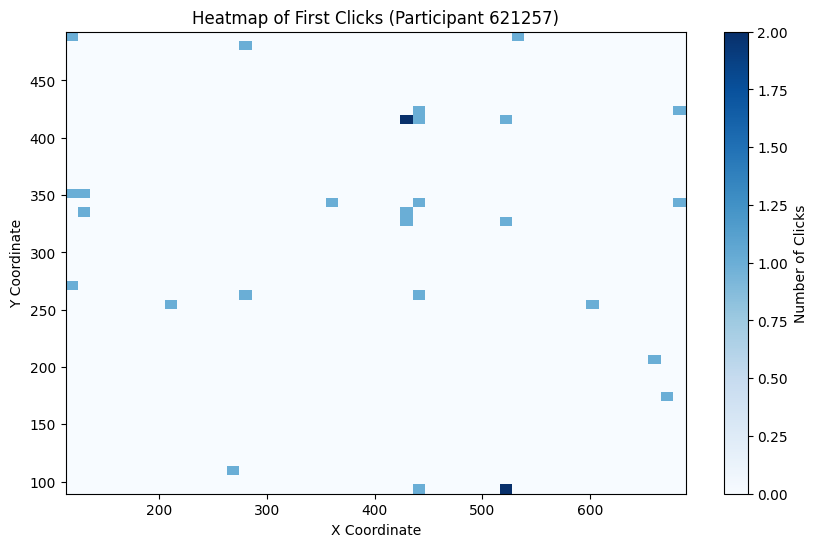

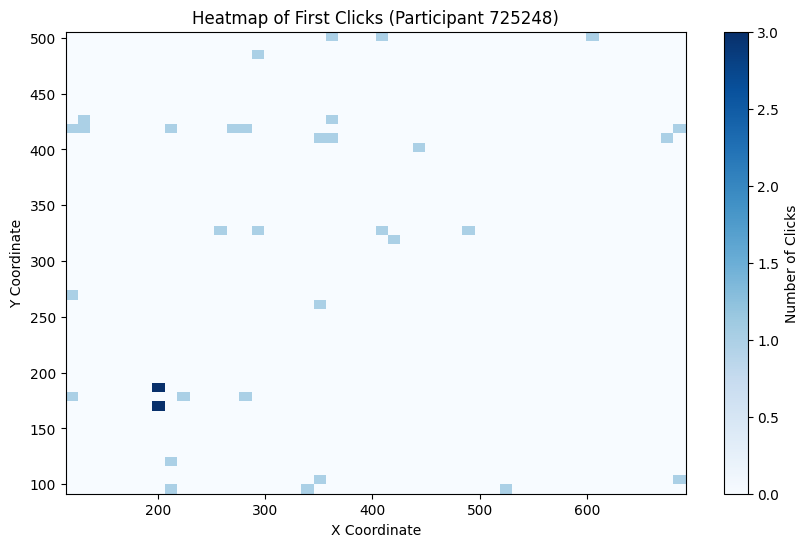

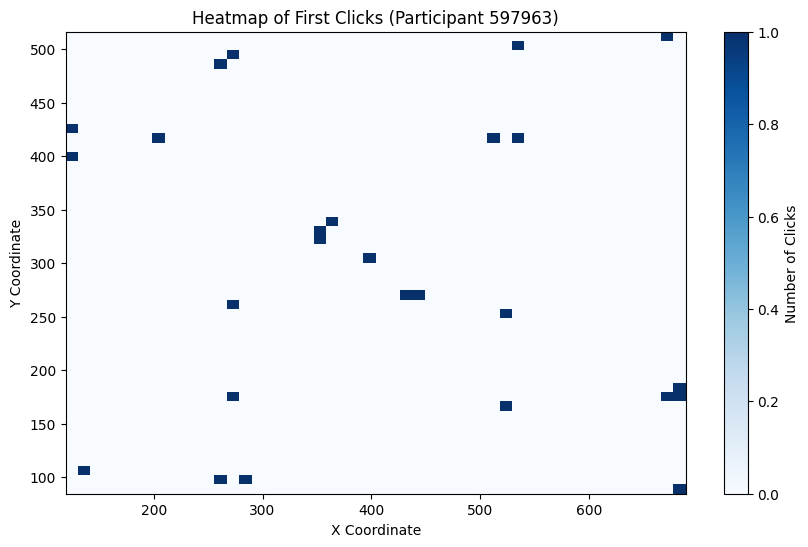

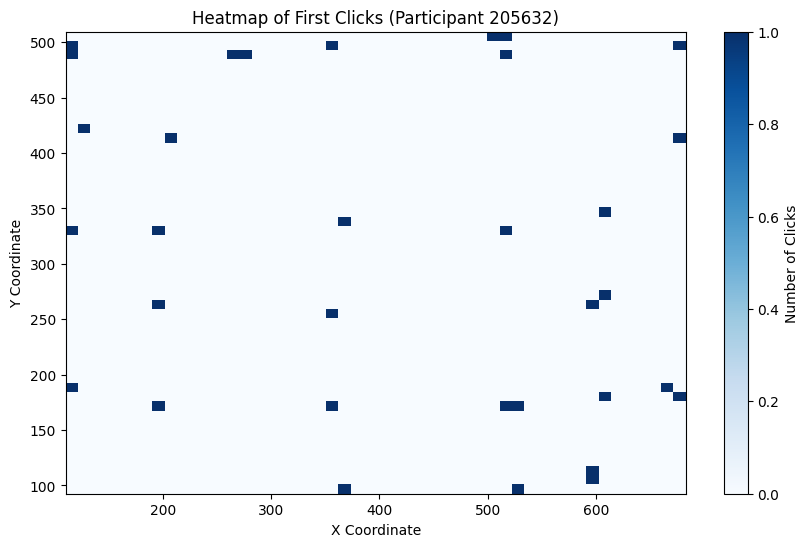

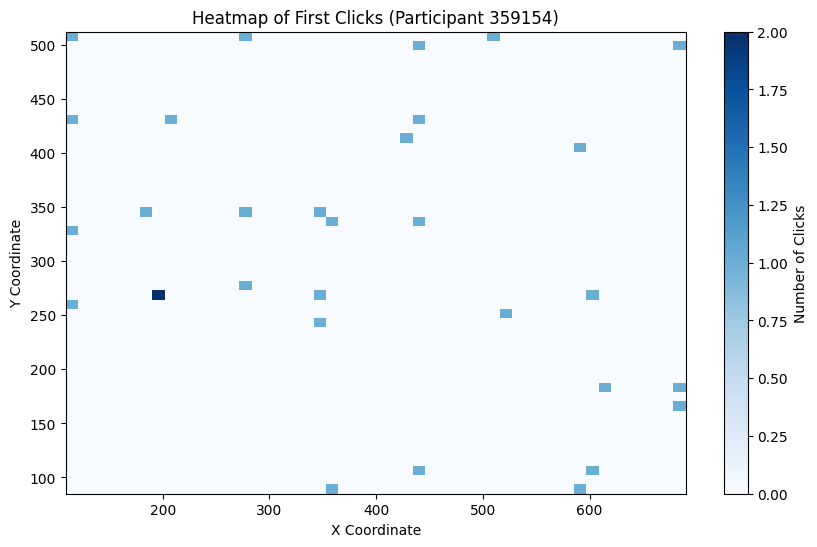

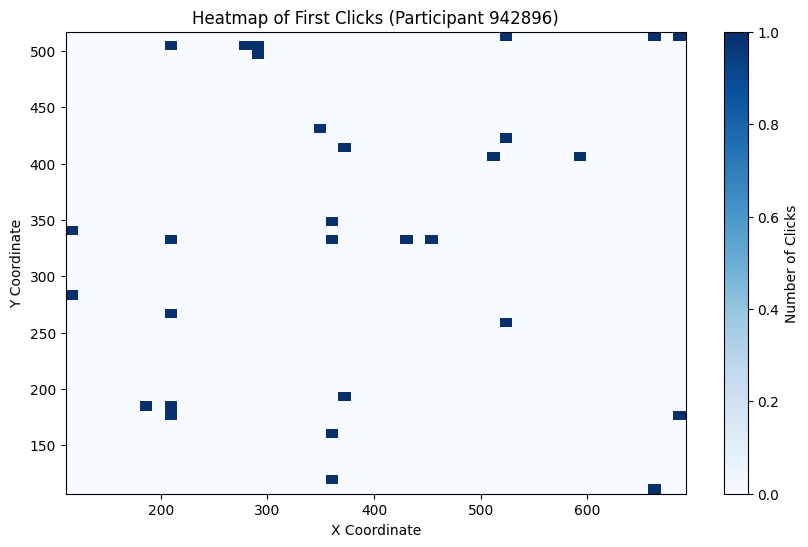

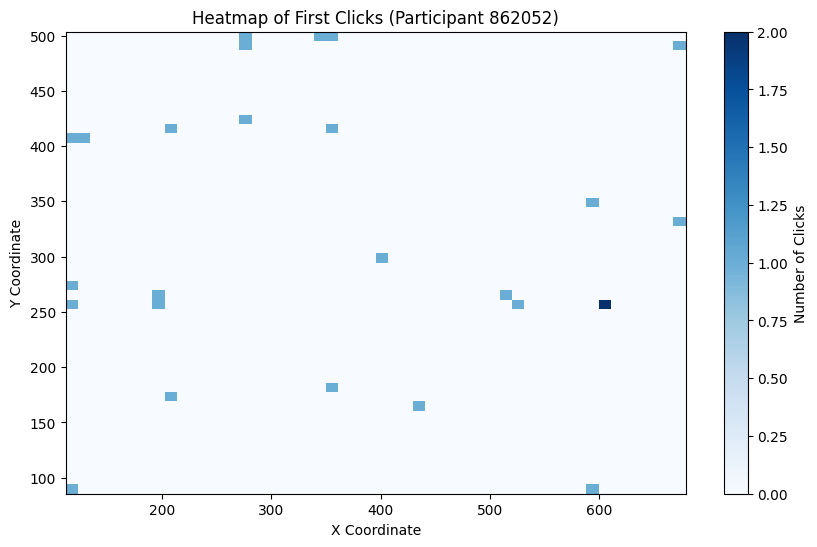

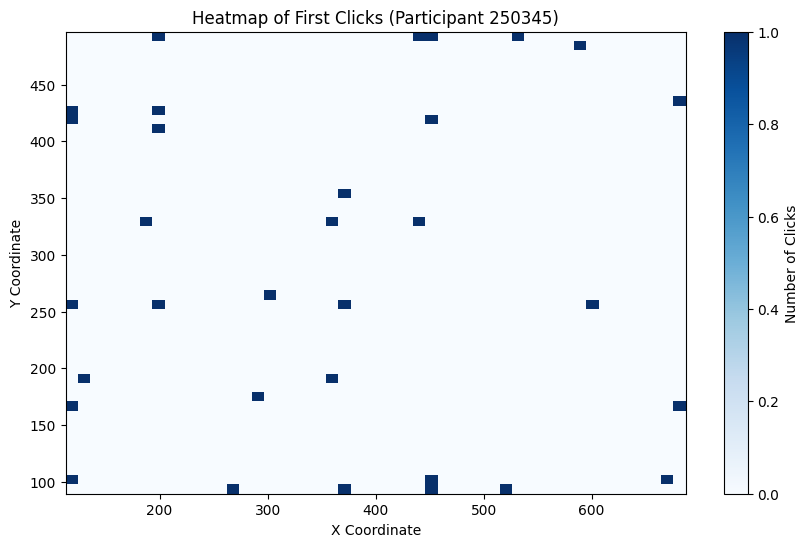

In [ ]:
# 2. Heatmap for Each Participant Separately
unique_participants = df_filtered['subjectId'].unique()

for participant in unique_participants:
    participant_data = df_filtered[df_filtered['subjectId'] == participant]

    # Check if there are valid clicks for the participant
    if not np.isnan(participant_data['first_click_x']).all() and not np.isnan(participant_data['first_click_y']).all():
        plt.figure(figsize=(10, 6))
        plt.hist2d(participant_data['first_click_x'].dropna(), participant_data['first_click_y'].dropna(), bins=50, cmap='Blues')
        plt.colorbar(label='Number of Clicks')
        plt.xlabel('X Coordinate')
        plt.ylabel('Y Coordinate')
        plt.title(f'Heatmap of First Clicks (Participant {participant})')
        plt.show()

Some participants show more *regular* first click positions.

Lets create some animations to show how average click locations change across each trial's time course:

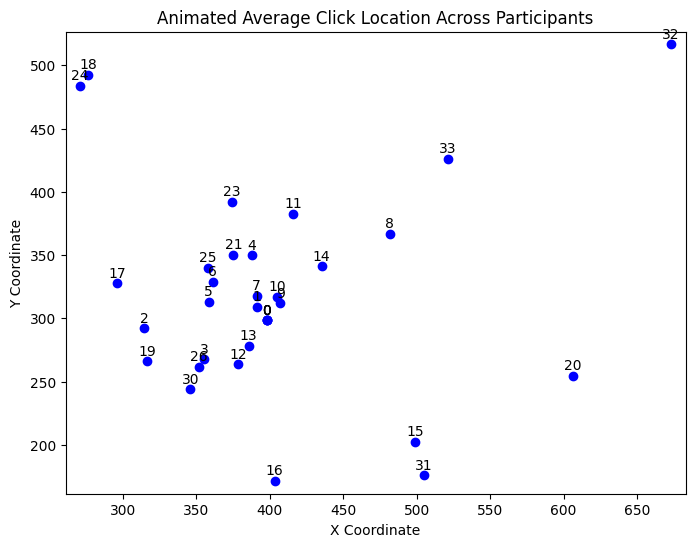

In [ ]:
# resample data and average x y location in specified time bins to prep for animating
def prepare_avg_data_in_time(df_filtered, time_bin_ms=1000): #default time bin 1 second
    # Convert clicks into lists
    df_filtered['allClicks_list'] = df_filtered['allClicks'].apply(safe_eval).apply(lambda x: x if x else [])

    # Extract all x, y, and time coordinates for each trial
    df_filtered['all_x'] = df_filtered['allClicks_list'].apply(lambda clicks: [click['x'] for click in clicks])
    df_filtered['all_y'] = df_filtered['allClicks_list'].apply(lambda clicks: [click['y'] for click in clicks])
    df_filtered['all_time'] = df_filtered['allClicks_list'].apply(lambda clicks: [click['time'] for click in clicks])

    # For overall data
    all_data = df_filtered.explode(['all_x', 'all_y', 'all_time']).dropna(subset=['all_x', 'all_y', 'all_time'])

    # Convert all_time to timedelta format
    all_data['all_time'] = pd.to_timedelta(all_data['all_time'], unit='ms')

    # Resampling using the time bin directly in milliseconds
    time_bin_timedelta = pd.to_timedelta(time_bin_ms, unit='ms') # convert to timedelta
    all_data.set_index('all_time', inplace=True)
    avg_data = all_data.resample(time_bin_timedelta).agg({'all_x': 'mean', 'all_y': 'mean'}).reset_index()

    return avg_data

# option to plot the average location of each click (not as informative)
def prepare_avg_data_in_sequence(df_filtered):
    # Convert clicks into lists
    df_filtered['allClicks_list'] = df_filtered['allClicks'].apply(safe_eval).apply(lambda x: x if x else [])

    # Extract all x, y, and time coordinates for each trial
    df_filtered['all_x'] = df_filtered['allClicks_list'].apply(lambda clicks: [click['x'] for click in clicks])
    df_filtered['all_y'] = df_filtered['allClicks_list'].apply(lambda clicks: [click['y'] for click in clicks])

    # Calculate the maximum number of clicks across all trials
    max_clicks = df_filtered['allClicks_list'].apply(len).max()

    # Placeholder lists for average data
    avg_x = []
    avg_y = []

    # Compute the average x and y for each click number
    for i in range(max_clicks):
        avg_x.append(df_filtered['all_x'].apply(lambda x: x[i] if i < len(x) else np.nan).mean())
        avg_y.append(df_filtered['all_y'].apply(lambda y: y[i] if i < len(y) else np.nan).mean())

    avg_data = pd.DataFrame({
        'all_x': avg_x,
        'all_y': avg_y,
        'click_number': range(1, max_clicks + 1)
    })

    return avg_data

def create_animation(data, title):
    # Create the scatter plot
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_xlim(data['all_x'].min() - 10, data['all_x'].max() + 10)
    ax.set_ylim(data['all_y'].min() - 10, data['all_y'].max() + 10)
    ax.set_title(title)
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')

    dots = [] # List to store all dot elements (for the blit mechanism)
    labels = [] # List to store all text labels (for the blit mechanism)

    # Animation function
    def animate(i):
        time_data = data.iloc[i]
        if not np.isnan(time_data['all_x']) and not np.isnan(time_data['all_y']):
            dot = ax.scatter(time_data['all_x'], time_data['all_y'], color='blue')
            label = ax.text(time_data['all_x'], time_data['all_y'] + 5, str(i), ha='center') # Using i as the label here
            dots.append(dot)
            labels.append(label)
        return (*dots, *labels)

    # Create the animation
    ani = animation.FuncAnimation(fig, animate, frames=len(data), blit=True, repeat=False)

    return HTML(ani.to_jshtml())

# Prepare data
avg_data = prepare_avg_data_in_time(df_filtered, 500)

# Display animation
display(create_animation(avg_data, 'Animated Average Click Location Across Participants'))


Text labels correspond to the index of the time bin (e.g. 0 represents the average x y click locations in the first time bin of 0-500 ms if time_bin_ms = 500).

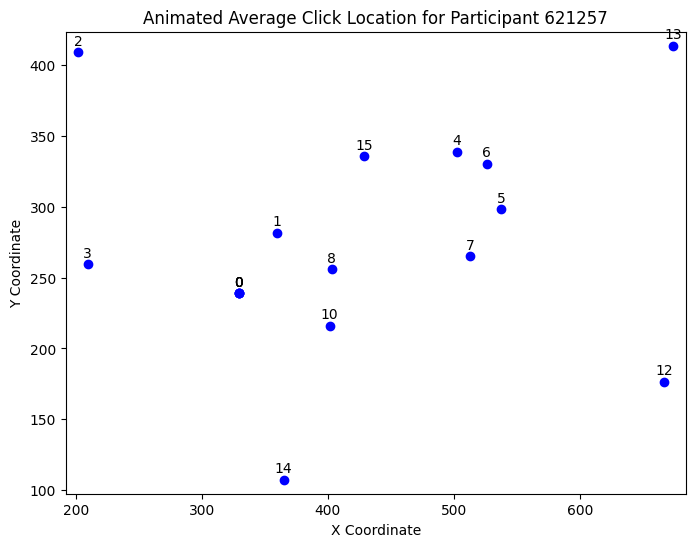

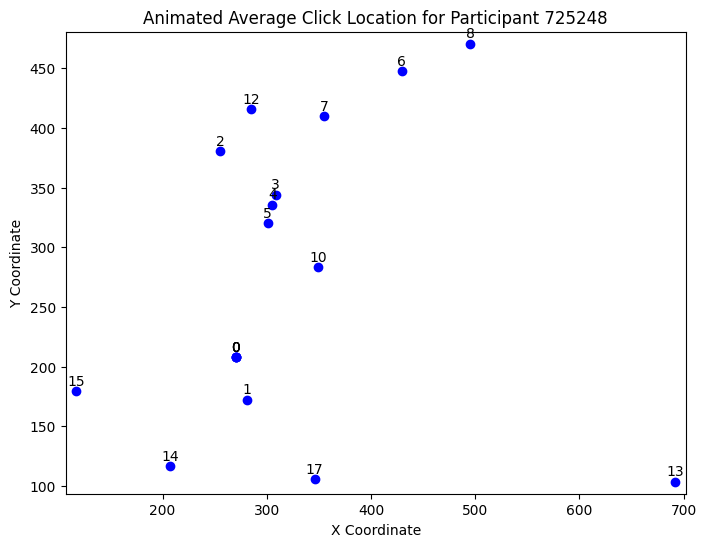

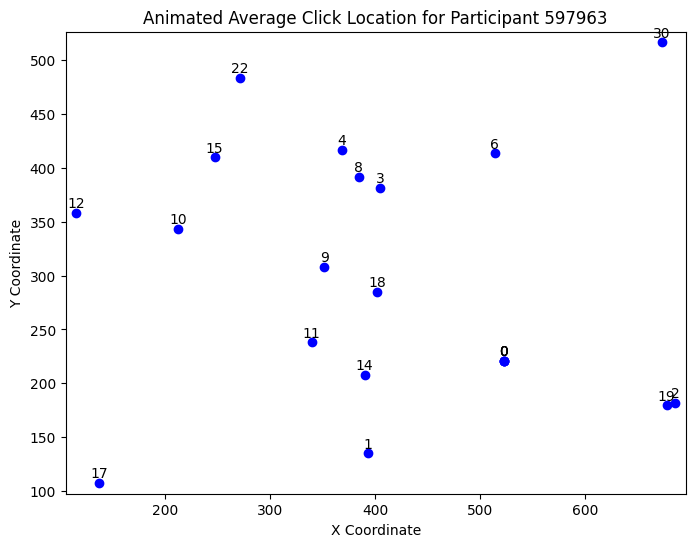

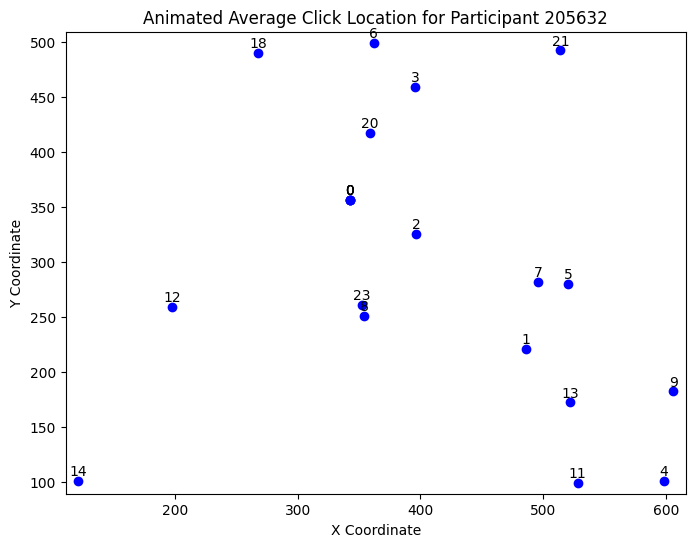

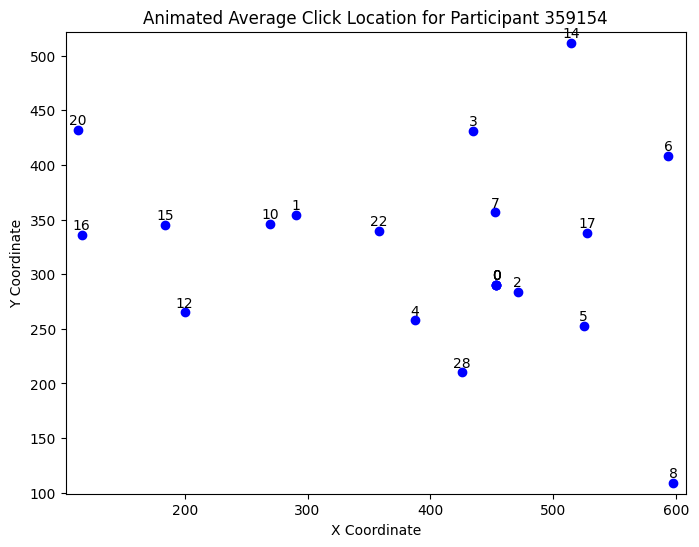

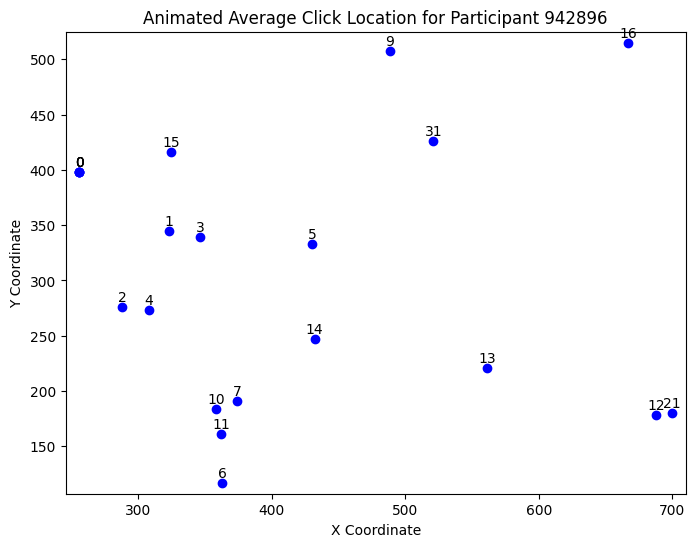

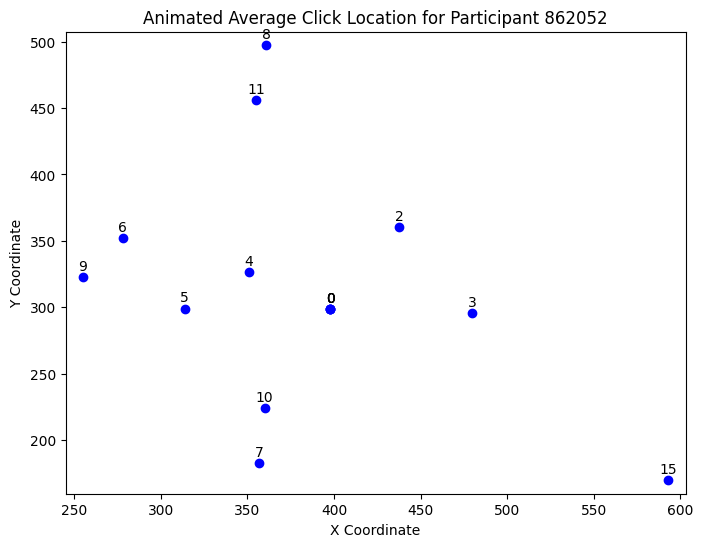

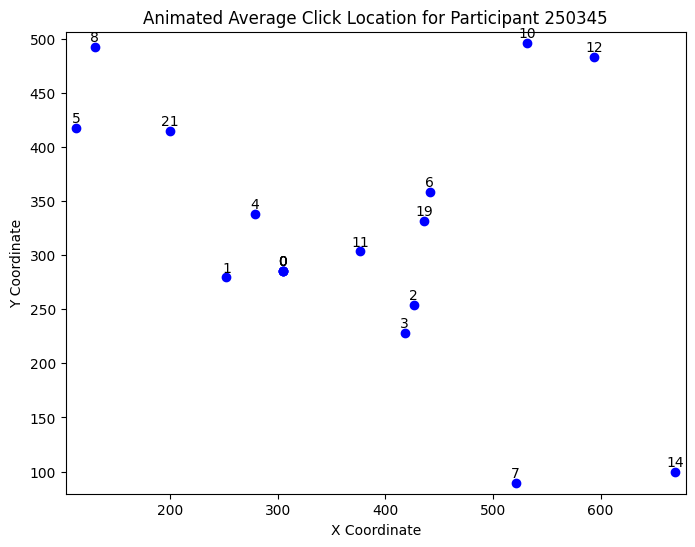

In [ ]:
# Make the click animation for each participant
for participant in df_filtered['subjectId'].unique():
    participant_data = df_filtered[df_filtered['subjectId'] == participant].copy()

    # Use the prepare_avg_data_in_time function to get the avg_data for the current participant
    avg_data = prepare_avg_data_in_time(participant_data, 500)

    # Display animation
    display(create_animation(avg_data, f'Animated Average Click Location for Participant {participant}'))